## Import Helper Function and Parameter

In [ ]:
cd("c:/Disk_D/Master Research/Research-Project")
include(joinpath(@__DIR__,"..", "Helper_util", "util.jl"))
include(joinpath(@__DIR__, "..", "Parameter", "parameter.jl"));

## Parameter Definition

In [ ]:
## Define the diffusion coefficients and wave WaveNumber
diffusion_coefficient = DiffusionParameter(1, 0.0001, 0.001, 0.0001)
total_population=Total_Population(0.4).total
## parameter setting up 2
Nₜ = global_parameter_1.Nₜ
λ, ν = global_parameter_1.λ, global_parameter_1.ν
δ, α, g, m = global_parameter_1.δ, global_parameter_1.α, global_parameter_1.g, global_parameter_1.m
d₁, d₂, d₃, d₄, k = diffusion_coefficient.d₁, diffusion_coefficient.d₂, diffusion_coefficient.d₃, diffusion_coefficient.d₄, WaveNumber(3).k;
d₁_vec=Diffusion_Vec_Parameter(0.1:0.1:10).d_vec;

## ODE_PDE_GrowthRate

In [ ]:
Nₜ=0.1:0.01:1
ODE_eigen = zeros(Float64, length(Nₜ))

for j in 1:length(Nₜ)
    ODE_eigen[j], _ , _ = ODE_PDE_system_4D(Nₜ, λ, ν, δ, α, g, m, d₁, d₂, d₃, d₄, k)[j]
end

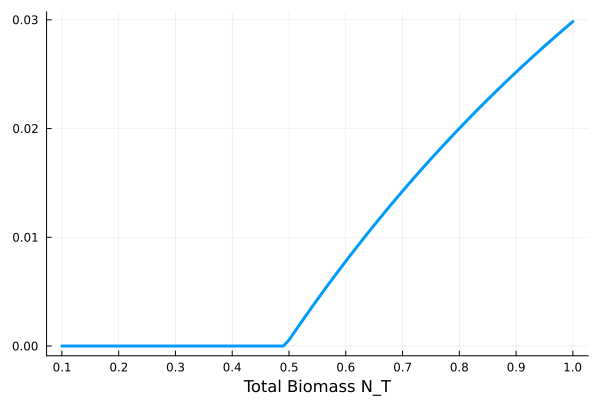

In [6]:
plot(Nₜ, ODE_eigen[:,1], xlabel="Total Biomass N_T",legend=false,xticks=0:0.1:maximum(Nₜ),lw=3)

In [ ]:
k_range = 0.5:0.5:8
m_range = 0:0.01:1
plot_eigenvalue_heatmap_4D("4D_eigen_k_m_various", total_population, λ, ν, δ, α, g, d₁, d₂, d₃, d₄, m_range, k_range)

In [ ]:
k_values = [1, 3, 7, 9]
d₁_vec = 0:0.01:2
Nₜ=0.1:0.01:1
plot_combined_heatmaps_4D(k_values, Nₜ, λ, ν, δ, α, g, m, d₁_vec, d₂, d₃, d₄, ODE_PDE_system_4D;
                       layout=(2,2), output_file="4D_PDE_eigen_subplots.png")


## Max of real part of PDE v.s. WaveNumber k

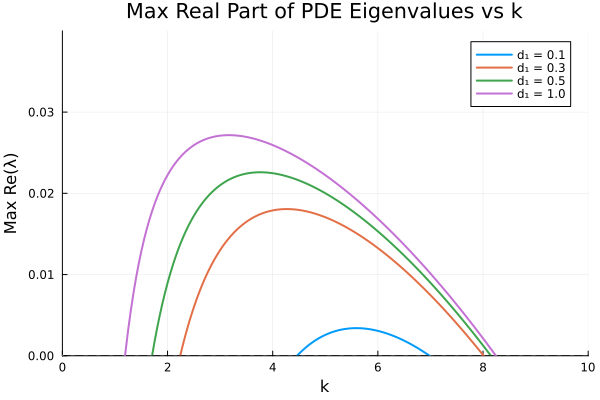

In [12]:
k_values=0:0.05:30
d_values = [0.1, 0.3, 0.5, 1.0]
plot_pde_eigenvalues_4D(total_population, λ, ν, δ, α, g, m, d_values, d₂, d₃, d₄, k_values, (0, 10), (0, 0.04))

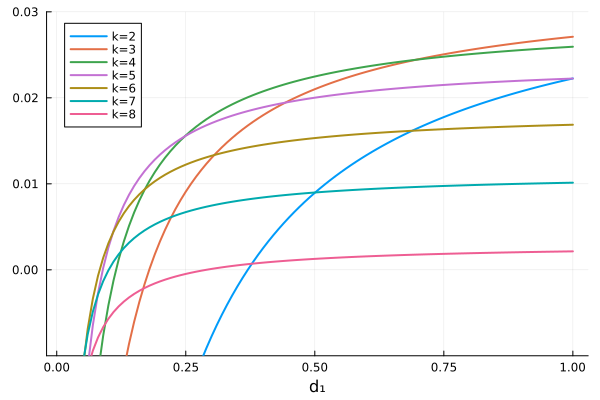

In [32]:
using Plots

# parameter setup
d₁_vec = 0.01:0.01:1
k_values = [2,3,4,5,6,7,8]
n_d1 = length(d₁_vec)

# store results: one matrix for each k
PDE_eigen = zeros(n_d1, length(k_values))

for (j, k) in enumerate(k_values)
    for (i, d₁) in enumerate(d₁_vec)
        PDE_eigen[i, j] = ODE_PDE_system_4D(total_population, λ, ν, δ, α, g, m, d₁, d₂, d₃, d₄, k)[1][2]
    end
end

# plot all curves on same figure
plt = plot(xlabel="d₁")

for ki in 1:length(k_values)
    plot!(plt, d₁_vec, PDE_eigen[:, ki], label="k=$(k_values[ki])",lw=2,ylims=(-0.01,0.03))
end

display(plt)


## Stable Equilibrium

In [17]:
N̄, P̄, Z̄, D̄= equilibrium_state_4D(total_population, λ, ν, δ, α, g, m)
N̄, P̄, Z̄, D̄=N̄[1], P̄[1], Z̄[1], D̄[1]

(0.21324421327576293, 0.024890190336749635, 0.13605433341871628, 0.02581126296877118)

## Initial Condition

In [18]:
function N_initial_cond(x)
    C₁=real(ODE_PDE_system_4D(total_population, λ, ν, δ, α, g, m, d₁, d₂, d₃, d₄, k)[1][4][1])
    N = N̄+1e-5*C₁*cos(k*x)
    return(N)
end


function P_initial_cond(x)
    C₂=real(ODE_PDE_system_4D(total_population, λ, ν, δ, α, g, m, d₁, d₂, d₃, d₄, k)[1][4][2])
    P = P̄+1e-5*C₂*cos(k*x)
    return(P)
end

function Z_initial_cond(x)
    C₃=real(ODE_PDE_system_4D(total_population, λ, ν, δ, α, g, m, d₁, d₂, d₃, d₄, k)[1][4][3])
    Z = Z̄+1e-5*C₃*cos(k*x)
    return(Z)
end

function D_initial_cond(x)
    C₄=real(ODE_PDE_system_4D(total_population, λ, ν, δ, α, g, m, d₁, d₂, d₃, d₄, k)[1][4][4])
    D = D̄ + 1e-5*C₄*cos(k*x)
    return(D)
end

D_initial_cond (generic function with 1 method)

In [18]:
function random_IC_N(x)
    noise = rand(Normal(0, 1e-6))
    return N̄ + noise
end

function random_IC_P(x)
    noise = rand(Normal(0, 1e-6))
    return P̄ + noise
end

function random_IC_Z(x)
    noise = rand(Normal(0, 1e-6))
    return Z̄ + noise
end

function random_IC_D(x)
    noise = rand(Normal(0, 1e-6))
    return D̄ + noise
end

random_IC_D (generic function with 1 method)

## Model setting up

In [21]:
## Initialize the model
NPZD_parameters = ( d₁ = d₁,
                    d₂ = d₂,
                    d₃ = d₃,
                    d₄ = d₄,
                    ν = ν ,          
                    λ = λ ,
                    δ = δ,
                    α = α,
                    g = g,
                    m = m
)



growth_P(z, t, N, P, Z, D, params) = params.ν * P * N / (N + 1)
death_P(z, t, N, P, Z, D, params) = params.λ*(max(0, P))^(params.m)

growth_Z(z, t, N, P, Z, D, params) = params.g * Z * P / (P + 1)
death_Z(z, t, N, P, Z, D, params) = params.δ * Z

growth_N(z, t, N, P, Z, D, params) = params.α * D





N_reaction(z, t, N, P, Z, D, params) = - growth_P(z, t, N, P, Z, D, params) + growth_N(z, t, N, P, Z, D, params)

P_reaction(z, t, N, P, Z, D, params)=   growth_P(z, t, N, P, Z, D, params)- death_P(z, t, N, P, Z, D, params) - growth_Z(z, t, N, P, Z, D, params)

Z_reaction(z, t, N, P, Z, D, params) =  growth_Z(z, t, N, P, Z, D, params) - death_Z(z, t, N, P, Z, D, params)

D_reaction(z, t, N, P, Z, D, params) =  death_P(z, t, N, P, Z, D, params)+ death_Z(z, t, N, P, Z, D, params) - growth_N(z, t, N, P, Z, D, params)



N_forcing = Forcing(N_reaction, field_dependencies = (:N, :P, :Z, :D), parameters = NPZD_parameters)
P_forcing = Forcing(P_reaction, field_dependencies = (:N, :P, :Z, :D), parameters = NPZD_parameters)
Z_forcing = Forcing(Z_reaction, field_dependencies = (:N, :P, :Z, :D), parameters = NPZD_parameters)
D_forcing = Forcing(D_reaction, field_dependencies = (:N, :P, :Z, :D), parameters = NPZD_parameters)

grid = RectilinearGrid(size=64, z=(0,2*π), topology=(Flat, Flat, Bounded))

diffusivities = NamedTuple{(:N, :P, :Z, :D)}((NPZD_parameters.d₁, NPZD_parameters.d₂, NPZD_parameters.d₃, NPZD_parameters.d₄))

closure = ScalarDiffusivity(κ=diffusivities)

model   = NonhydrostaticModel(; grid,
                             closure,
                             tracers = (:N, :P, :Z, :D),
                             forcing = (N=N_forcing, P=P_forcing, Z=Z_forcing, D=D_forcing)
                             )

NonhydrostaticModel{CPU, RectilinearGrid}(time = 0 seconds, iteration = 0)
├── grid: 1×1×64 RectilinearGrid{Float64, Flat, Flat, Bounded} on CPU with 0×0×3 halo
├── timestepper: RungeKutta3TimeStepper
├── advection scheme: Centered reconstruction order 2
├── tracers: (N, P, Z, D)
├── closure: ScalarDiffusivity{ExplicitTimeDiscretization}(ν=0.0, κ=(N=0.5, P=0.0001, Z=0.001, D=0.0001))
├── buoyancy: Nothing
└── coriolis: Nothing

In [22]:
## Define the initial condition:
Oceananigans.set!(model, N = N_initial_cond , P = P_initial_cond , Z = Z_initial_cond, D = D_initial_cond)
min_Δz = minimum_zspacing(model.grid)
diffusion_time_scale = min_Δz^2 / model.closure.κ.N;

## Run Simulation

In [24]:
## Running simulation
max_time=170
simulation = Simulation(model, Δt =  0.1 * diffusion_time_scale, stop_time = max_time)

########################################

N, P, Z, D = model.tracers

perturbation_N(args...) = norm(N .- N̄)
perturbation_P(args...) = norm(P .- P̄)
perturbation_Z(args...) = norm(Z .- Z̄)
perturbation_D(args...) = norm(D .- D̄)

simulation.output_writers[:growth_NPZ] =
    NetCDFOutputWriter(model, (; perturbation_N, perturbation_P, perturbation_Z, perturbation_D);
                     filename = "4D_simu_k3_parameter_1/NPZDk3_d05.nc",
                     schedule = IterationInterval(10),
                     dimensions = (; perturbation_N = (),
                                     perturbation_P = (),
                                     perturbation_Z = (),
                                     perturbation_D = ()),
                     overwrite_existing = true)

simulation.output_writers[:fields] =
    JLD2OutputWriter(model, model.tracers,
                     filename = "4D_simu_k3_parameter_1/NPZDk3_d05.jld2",
                     schedule=IterationInterval(200),
                     overwrite_existing = true)

run!(simulation)

┌ Info: Initializing simulation...
└ @ Oceananigans.Simulations C:\Users\xiang\.julia\packages\Oceananigans\EYQtB\src\Simulations\run.jl:184
┌ Info:     ... simulation initialization complete (7.170 seconds)
└ @ Oceananigans.Simulations C:\Users\xiang\.julia\packages\Oceananigans\EYQtB\src\Simulations\run.jl:228
┌ Info: Executing initial time step...
└ @ Oceananigans.Simulations C:\Users\xiang\.julia\packages\Oceananigans\EYQtB\src\Simulations\run.jl:117
┌ Info:     ... initial time step complete (3.078 seconds).
└ @ Oceananigans.Simulations C:\Users\xiang\.julia\packages\Oceananigans\EYQtB\src\Simulations\run.jl:126
┌ Info: Simulation is stopping after running for 7.955 minutes.
└ @ Oceananigans.Simulations C:\Users\xiang\.julia\packages\Oceananigans\EYQtB\src\Simulations\simulation.jl:200
┌ Info: Simulation time 2.833 minutes equals or exceeds stop time 2.833 minutes.
└ @ Oceananigans.Simulations C:\Users\xiang\.julia\packages\Oceananigans\EYQtB\src\Simulations\simulation.jl:201


## Cos(3x)

In [36]:
N_data, P_data, Z_data, D_data, times, space= key_variable_outcome_4D(169, model, "4D_simu_k3_parameter_1/NPZDk3_d01.jld2");

In [37]:
using PyPlot
heatmap_plot_4D("heatmap_4D_k3_p1_d01", N_data, P_data, Z_data, D_data, times, space)

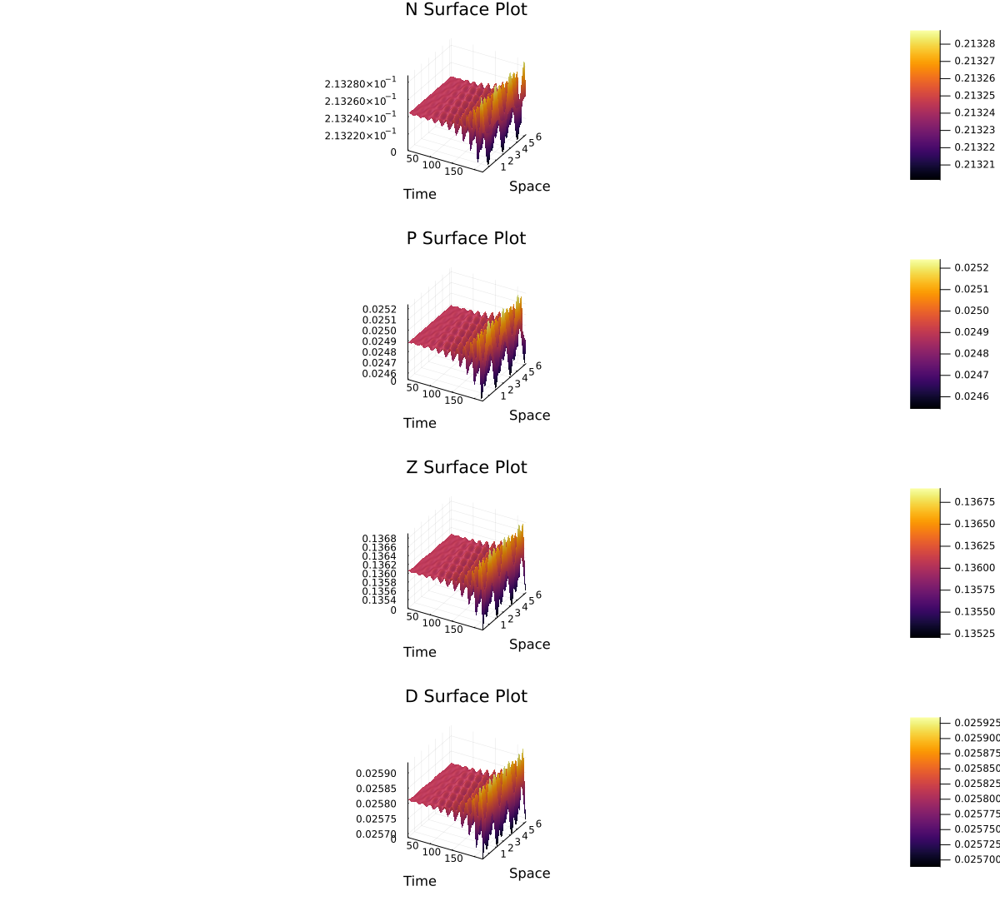

In [11]:
surface_plot_4D(N_data,P_data,Z_data,D_data,times,space)

In [ ]:
experiment_growth_rate_4D("4D_simu_random_parameter_1/NPZDk3_longer_time.nc",total_population, 
                          800:900, 
                          800:900,
                          800:900, 
                          800:900, 
                          λ, ν, δ, g, m, d₁, d₂, d₃, d₄, k)

Growth rate of N is approximately 0.0011685146196014154 with oscilation period 14.375502894026226
Growth rate of P is approximately -0.001495731711135864 with oscilation period 10.888994836728429
Growth rate of Z is approximately -0.0009447779529111003 with oscilation period 13.887392575944498
Growth rate of D is approximately -0.001526816582723147 with oscilation period 13.795140414276018
Largest real part of e-value 0.02709915024192728

In [18]:
FFT_power_4D("fft_modes_4D_k3_p1", N_data, P_data, Z_data, D_data, N̄, P̄, Z̄, D̄, times)

## Random IC Simulation

In [22]:
N_data, P_data, Z_data, D_data, times, space= key_variable_outcome_4D(999, model, "4D_simu_random_parameter_1/NPZDrandom_longer_time.jld2");

In [24]:
using PyPlot
heatmap_plot_4D("heatmap_4D_random_p1_long_run", N_data, P_data, Z_data, D_data, times, space)

Growth rate of N is approximately -0.008091430731603927 with oscilation period 15.17659270433569
Growth rate of P is approximately -0.001046235104635452 with oscilation period 8.129090668814362
Growth rate of Z is approximately -0.0018184135247035153 with oscilation period 10.849307778591859
Growth rate of D is approximately -0.0022865988689735298 with oscilation period 12.246130237006778
Largest real part of e-value 0.02709915024192728

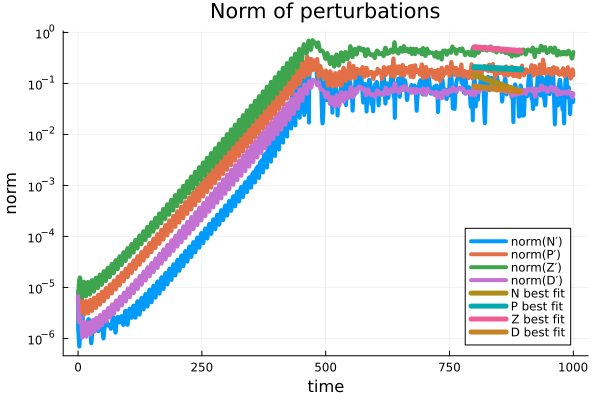

In [26]:
experiment_growth_rate_4D("4D_simu_random_parameter_1/NPZDrandom_longer_time.nc",total_population, 
                          800:900, 
                          800:900,
                          800:900, 
                          800:900, 
                          λ, ν, δ, g, m, d₁, d₂, d₃, d₄, k)

In [18]:
FFT_power_4D("fft_modes_4D_random_p1", N_data, P_data, Z_data, D_data, N̄, P̄, Z̄, D̄, times)

In [23]:
ODE_PDE_system_4D(total_population, λ, ν, δ, α, g, m, d₁, d₂, d₃, d₄, 1.5)[1][5]

0.015596380538465137 - 0.4009321955306985im

In [24]:
ODE_PDE_system_4D(total_population, λ, ν, δ, α, g, m, d₁, d₂, d₃, d₄, 2)[1][5]

0.02419078554538759 - 0.40142174538460057im

In [25]:
ODE_PDE_system_4D(total_population, λ, ν, δ, α, g, m, d₁, d₂, d₃, d₄, 3)[1][5]

0.02841731813736606 - 0.40235398459959576im

In [26]:
ODE_PDE_system_4D(total_population, λ, ν, δ, α, g, m, d₁, d₂, d₃, d₄, 3.5)[1][5]

0.02812213370532446 - 0.40252957886424745im